# C.Origami allele-specific Hi-C benchmark: Plan A / E / H

Compare GM12878 C.Origami predictions with dip3d allele-resolved Hi-C at 10 kb resolution over a shared set of genomic windows.

| Plan | pat | mat | all | merge |
|---|---|---|---|---|
| Plan A | Plan A | Plan A | Plan A | Plan A |
| Plan E | Plan E | Plan E | **alias of Plan A** | **alias of Plan A** |
| Plan H | Plan H | Plan H | Plan H | Plan H |

`pat` and `mat` are benchmarked against matching HP1/HP2 references. `all` and `merge` are both benchmarked against the dip3d merged reference. Plan E aliased values are retained for a complete four-type view but are labeled in every exported result.

## 1. Libraries and configuration

In [68]:
suppressPackageStartupMessages({
  library(data.table)
  library(tidyverse)
  library(pbmcapply)
  library(reticulate)
  library(imager)
  library(Matrix)
  library(hicrep)
  library(qs)
  library(GenomicRanges)
  library(rtracklayer)
  library(ggplot2)
  library(ggrastr)
  library(patchwork)
  library(RColorBrewer)
  library(cowplot)
})

options(stringsAsFactors = FALSE)
PLAN_LEVELS <- c("planA", "planE", "planH")
PRED_TYPES <- c("pat", "mat", "all", "merge")
RES <- 10000L
WIN_BINS <- 210L
PRED_SIZE_NATIVE <- 256L
MAX_REGIONS <- 5000L
MC_CORES <- 20L
SAVE_EVERY <- 100L

In [69]:
library(Cairo)
CairoFonts(
  regular = "sans:style=Regular",
  bold = "sans:style=Bold",
  italic = "sans:style=Italic",
  bolditalic = "sans:style=Bold Italic,BoldItalic",
  symbol = "Symbol", usePUA = TRUE
)

In [3]:
REF_MTX_DIR <- "/gpfs1/tangfuchou_pkuhpc/tangfuchou_test/lujiansen/project/scHic/ref/GM12878/dip3d/analysis/mtx"
REF_BINS <- "/gpfs1/tangfuchou_pkuhpc/tangfuchou_test/lujiansen/project/scHic/ref/GM12878/bam/GM12878_merged_10k_bins.gz"
SNP_SUMMARY <- "/gpfs1/tangfuchou_pkuhpc/tangfuchou_test/lujiansen/database/GM12878/GM12878/GM12878_2M_10k_snp_density_summary.txt"
BLACKLIST_BED <- "/gpfs1/tangfuchou_pkuhpc/tangfuchou_test/lujiansen/database/blacklist/hg38-blacklist.v2.bed"
BL_MIN_OVERLAP <- 50000L

PRED_SOURCES <- list(
  planA = list(
    pat = "/gpfs1/tangfuchou_pkuhpc/tangfuchou_test/lujiansen/software/corigami/predict/GM12878_pat/prediction/npy",
    mat = "/gpfs1/tangfuchou_pkuhpc/tangfuchou_test/lujiansen/software/corigami/predict/GM12878_mat/prediction/npy",
    all = "/gpfs1/tangfuchou_pkuhpc/tangfuchou_test/lujiansen/software/corigami/predict/GM12878/prediction/npy",
    merge = "/gpfs1/tangfuchou_pkuhpc/tangfuchou_test/lujiansen/software/corigami/predict/GM12878_merge/prediction/npy"
  ),
  planE = list(
    pat = "/gpfs1/tangfuchou_pkuhpc/tangfuchou_test/lujiansen/software/corigami/predict_planE/GM12878_pat_planE/prediction/npy",
    mat = "/gpfs1/tangfuchou_pkuhpc/tangfuchou_test/lujiansen/software/corigami/predict_planE/GM12878_mat_planE/prediction/npy",
    all = "/gpfs1/tangfuchou_pkuhpc/tangfuchou_test/lujiansen/software/corigami/predict/GM12878/prediction/npy",
    merge = "/gpfs1/tangfuchou_pkuhpc/tangfuchou_test/lujiansen/software/corigami/predict/GM12878_merge/prediction/npy"
  ),
  planH = list(
    pat = "/gpfs1/tangfuchou_pkuhpc/tangfuchou_test/lujiansen/software/corigami/predict_atac_model/GM12878_pat/prediction/npy",
    mat = "/gpfs1/tangfuchou_pkuhpc/tangfuchou_test/lujiansen/software/corigami/predict_atac_model/GM12878_mat/prediction/npy",
    all = "/gpfs1/tangfuchou_pkuhpc/tangfuchou_test/lujiansen/software/corigami/predict_atac_model/GM12878_all/prediction/npy",
    merge = "/gpfs1/tangfuchou_pkuhpc/tangfuchou_test/lujiansen/software/corigami/predict_atac_model/GM12878_merge/prediction/npy"
  )
)

PRED_ALIASES <- tribble(
  ~plan,   ~pred_type, ~aliased_from,
  "planE", "all",      "planA/all",
  "planE", "merge",    "planA/merge"
)

alias_from <- function(plan, pred_type) {
  hit <- PRED_ALIASES %>%
    filter(.data$plan == .env$plan, .data$pred_type == .env$pred_type)
  if (nrow(hit)) hit$aliased_from[[1]] else NA_character_
}

stopifnot(identical(names(PRED_SOURCES), PLAN_LEVELS))
stopifnot(all(vapply(PRED_SOURCES, function(x) identical(names(x), PRED_TYPES), logical(1))))
stopifnot(identical(PRED_SOURCES$planE$all, PRED_SOURCES$planA$all))
stopifnot(identical(PRED_SOURCES$planE$merge, PRED_SOURCES$planA$merge))

OUT_DIR <- "./corigami_planAEH_bench"
dir.create(OUT_DIR, showWarnings = FALSE, recursive = TRUE)

In [4]:
registry_tbl <- imap_dfr(PRED_SOURCES, function(paths, plan) {
  imap_dfr(paths, function(path, pred_type) {
    tibble(
      plan = plan,
      pred_type = pred_type,
      path = path,
      aliased_from = alias_from(plan, pred_type),
      directory_exists = dir.exists(path),
      n_files = if (dir.exists(path)) length(list.files(path, pattern = "[.]npy$")) else 0L
    )
  })
})

missing_dirs <- registry_tbl %>% filter(!directory_exists)
if (nrow(missing_dirs)) {
  stop("Missing prediction directories: ", paste(missing_dirs$path, collapse = ", "))
}
empty_dirs <- registry_tbl %>% filter(n_files == 0L)
if (nrow(empty_dirs)) {
  stop("No .npy files found for: ", paste(paste(empty_dirs$plan, empty_dirs$pred_type, sep = "/"), collapse = ", "))
}

cat("Prediction registry (Plan E all/merge are deliberate Plan A aliases):\n")
print(registry_tbl, n = Inf)

Prediction registry (Plan E all/merge are deliberate Plan A aliases):
# A tibble: 12 × 6
   plan  pred_type path                    aliased_from directory_exists n_files
   <chr> <chr>     <chr>                   <chr>        <lgl>              <int>
 1 planA pat       /gpfs1/tangfuchou_pkuh… NA           TRUE                5455
 2 planA mat       /gpfs1/tangfuchou_pkuh… NA           TRUE                5459
 3 planA all       /gpfs1/tangfuchou_pkuh… NA           TRUE                5455
 4 planA merge     /gpfs1/tangfuchou_pkuh… NA           TRUE                5000
 5 planE pat       /gpfs1/tangfuchou_pkuh… NA           TRUE                5813
 6 planE mat       /gpfs1/tangfuchou_pkuh… NA           TRUE                5813
 7 planE all       /gpfs1/tangfuchou_pkuh… planA/all    TRUE                5455
 8 planE merge     /gpfs1/tangfuchou_pkuh… planA/merge  TRUE                5000
 9 planH pat       /gpfs1/tangfuchou_pkuh… NA           TRUE                5000
10 planH mat       /

## 2. dip3d reference loader

In [5]:
required_reference_paths <- c(REF_MTX_DIR, REF_BINS, SNP_SUMMARY, BLACKLIST_BED)
missing_reference_paths <- required_reference_paths[!file.exists(required_reference_paths) & !dir.exists(required_reference_paths)]
if (length(missing_reference_paths)) {
  stop("Missing reference input(s): ", paste(missing_reference_paths, collapse = ", "))
}

ref_files <- list.files(REF_MTX_DIR, pattern = "_mtx[.]gz$", full.names = TRUE)
names(ref_files) <- sub("merged_(chr[^_]+)_([^_]+)_10000_mtx.gz", "\\2_\\1", basename(ref_files))
if (!length(ref_files)) stop("No dip3d reference matrices found in ", REF_MTX_DIR)

bins <- fread(REF_BINS, header = FALSE, col.names = c("chr", "start", "end"))
bins$idx <- 0:(nrow(bins) - 1L)
chr_bounds <- bins %>% group_by(chr) %>% summarise(chr_end = max(end), .groups = "drop")

cat("reference matrix files:", length(ref_files), "\n")
cat("10 kb bins:", nrow(bins), "\n")

reference matrix files: 69 
10 kb bins: 308837 


In [6]:
ref_df <- pbmclapply(ref_files, function(path) {
  fread(path, col.names = c("id1", "id2", "counts", "weight"))
}, mc.cores = 10, ignore.interactive = TRUE)

if (length(ref_df) != length(ref_files)) {
  stop("ref_df length=", length(ref_df), " expected ", length(ref_files),
       "; lower mc.cores and rerun if the worker pool was truncated")
}
bad_ref <- which(vapply(ref_df, function(x) inherits(x, "try-error") || is.null(x) || !nrow(x), logical(1)))
if (length(bad_ref)) {
  stop("Failed reference entries: ", paste(head(names(ref_df)[bad_ref], 10), collapse = ", "))
}
cat("reference matrices loaded:", length(ref_df), "(all OK)\n")

  |=======================================================| 100%, Elapsed 00:15
reference matrices loaded: 69 (all OK)


In [7]:
df2mtx <- function(df, start_id, end_id, val_col = "counts") {
  df %>%
    filter(id1 %in% start_id:end_id, id2 %in% start_id:end_id) %>%
    mutate(
      id1 = factor(id1, levels = start_id:end_id),
      id2 = factor(id2, levels = start_id:end_id)
    ) %>%
    group_by(id1, id2) %>%
    summarise(!!val_col := mean(.data[[val_col]], na.rm = TRUE), .groups = "drop") %>%
    reshape2::dcast(id1 ~ id2, value.var = val_col, drop = FALSE) %>%
    tibble::column_to_rownames("id1") %>%
    as.matrix()
}

tri_to_full <- function(mtx) {
  mtx[lower.tri(mtx)] <- t(mtx)[lower.tri(mtx)]
  mtx
}

get_ref_window <- function(chr, start, val = "counts", width = WIN_BINS) {
  start <- as.integer(start)
  start_id <- bins$idx[bins$chr == chr & bins$start == start]
  if (length(start_id) != 1L) stop(sprintf("reference bin not found or non-unique: %s:%s", chr, start))
  end_id <- start_id + width - 1L
  chr_last_id <- max(bins$idx[bins$chr == chr])
  if (end_id > chr_last_id) stop(sprintf("reference window exceeds chromosome bounds: %s:%s", chr, start))

  build <- function(tag) {
    key <- paste0(tag, "_", chr)
    if (is.null(ref_df[[key]])) return(NULL)
    mtx <- tri_to_full(df2mtx(ref_df[[key]], start_id, end_id, val))
    mtx[is.na(mtx)] <- 0
    mtx
  }

  merged <- build("all")
  list(pat = build("HP1"), mat = build("HP2"), all = merged, merge = merged)
}

reference_for_type <- function(ref, pred_type) {
  switch(pred_type, pat = ref$pat, mat = ref$mat, all = ref$merge, merge = ref$merge,
         stop("Unknown prediction type: ", pred_type))
}

## 3. Lazy prediction loader

In [8]:
Sys.setenv(RETICULATE_PYTHON = "/gpfs1/tangfuchou_pkuhpc/tangfuchou_test/lujiansen/software/anaconda3/envs/HiC/bin/python3")
np <- NULL

loadnpy <- function(path) {
  if (is.null(np)) np <<- reticulate::import("numpy", convert = FALSE)
  arr <- reticulate::py_to_r(np$load(path))
  expected_dim <- rep(PRED_SIZE_NATIVE, 2L)
  if (!is.numeric(arr) || length(dim(arr)) != 2L || !identical(as.integer(dim(arr)), expected_dim)) {
    stop("Invalid prediction matrix (expected 256 x 256 numeric array): ", path)
  }
  matrix(arr, nrow = nrow(arr), ncol = ncol(arr))
}

resize_mtx <- function(mtx, size = WIN_BINS) {
  image <- suppressMessages(imager::as.cimg(mtx))
  resized <- suppressMessages(imager::resize(image, size_x = size, size_y = size, interpolation = 3))
  as.matrix(resized)
}

pred_cache <- new.env(hash = TRUE)

list_pred <- function(plan) {
  if (!plan %in% PLAN_LEVELS) stop("Unknown plan: ", plan)
  if (is.null(pred_cache[[plan]])) {
    files <- lapply(PRED_SOURCES[[plan]], function(path) {
      found <- list.files(path, pattern = "[.]npy$", full.names = TRUE)
      setNames(found, sub("[.]npy$", "", basename(found)))
    })
    matrices <- setNames(lapply(PRED_TYPES, function(x) list()), PRED_TYPES)
    pred_cache[[plan]] <- list(files = files, matrices = matrices)
  }
  pred_cache[[plan]]
}

get_pred <- function(plan, pred_type, chr, start) {
  if (!pred_type %in% PRED_TYPES) stop("Unknown prediction type: ", pred_type)
  source <- list_pred(plan)
  key <- paste0(chr, "_", as.integer(start))
  if (!key %in% names(source$files[[pred_type]])) return(NULL)
  if (is.null(source$matrices[[pred_type]][[key]])) {
    path <- source$files[[pred_type]][[key]]
    if (!file.exists(path)) return(NULL)
    source$matrices[[pred_type]][[key]] <- resize_mtx(loadnpy(path))
    pred_cache[[plan]] <- source
  }
  pred_cache[[plan]]$matrices[[pred_type]][[key]]
}

## 4. Shared regions: coverage, chromosome bounds, and blacklist

In [9]:
covered_regions <- function(plans = PLAN_LEVELS, pred_types = PRED_TYPES) {
  key_sets <- unlist(lapply(plans, function(plan) {
    lapply(pred_types, function(pred_type) names(list_pred(plan)$files[[pred_type]]))
  }), recursive = FALSE)
  if (!length(key_sets) || any(lengths(key_sets) == 0L)) return(character())
  Reduce(intersect, key_sets)
}

regions_keys <- covered_regions()
if (!length(regions_keys)) {
  stop("No common prediction regions remain across Plan A/E/H x pat/mat/all/merge")
}

snp_sum_sw <- fread(SNP_SUMMARY) %>% as.data.frame()
snp_sum_sw$start <- as.integer(snp_sum_sw$start)
snp_sum_sw$key <- paste0(snp_sum_sw$chrom, "_", snp_sum_sw$start)
snp_sum_sw$rank <- seq_len(nrow(snp_sum_sw))

snp_valid <- snp_sum_sw %>%
  filter(key %in% regions_keys) %>%
  inner_join(chr_bounds, by = c("chrom" = "chr")) %>%
  filter(start + WIN_BINS * RES <= chr_end) %>%
  semi_join(bins %>% transmute(chrom = chr, start = as.integer(start)), by = c("chrom", "start")) %>%
  arrange(rank)

bl_gr <- rtracklayer::import(BLACKLIST_BED)
GenomeInfoDb::seqlevelsStyle(bl_gr) <- "UCSC"
window_gr <- GRanges(
  seqnames = snp_valid$chrom,
  ranges = IRanges(start = snp_valid$start, end = snp_valid$start + WIN_BINS * RES - 1L)
)
blacklist_bp <- vapply(seq_along(window_gr), function(i) {
  chr_i <- as.character(seqnames(window_gr[i]))
  bl_chr <- bl_gr[as.character(seqnames(bl_gr)) == chr_i]
  if (!length(bl_chr)) return(0L)
  overlap <- GenomicRanges::intersect(window_gr[i], bl_chr)
  if (!length(overlap)) 0L else as.integer(sum(width(overlap)))
}, integer(1))

n_before_blacklist <- nrow(snp_valid)
snp_valid <- snp_valid[blacklist_bp <= BL_MIN_OVERLAP, , drop = FALSE]
if (!nrow(snp_valid)) {
  stop("No common regions remain after chromosome-bound and ENCODE blacklist filters")
}

N_BENCH <- min(MAX_REGIONS, nrow(snp_valid))
df_bench <- head(snp_valid, N_BENCH)
cat("common prediction keys:", length(regions_keys), "\n")
cat("valid after bounds/blacklist:", nrow(snp_valid), "of", n_before_blacklist, "pre-blacklist windows\n")
cat("benchmark regions:", N_BENCH, "\n")

common prediction keys: 5000 
valid after bounds/blacklist: 4714 of 5000 pre-blacklist windows
benchmark regions: 4714 


## 5. Contact-map visualization

In [50]:
plot_missing <- function(title) {
  ggplot() + theme_void() + labs(title = paste0(title, "\n(missing)")) +
    theme(plot.title = element_text(hjust = 0.5, colour = "grey50"))
}

plot_map_gg <- function(mtx, valmin = 0, valmax = 3, title = NULL,
                        color = c("white", "lightpink", "red", "black"),
                        width = WIN_BINS, log_scale = TRUE) {
  if (is.null(mtx)) return(plot_missing(title))
  plot_df <- summary(as(mtx, "sparseMatrix")) %>% as.data.frame() %>%
    filter(i <= width, j <= width)
  plot_df$value <- if (log_scale) pmin(log2(plot_df$x + 1), valmax) else pmin(plot_df$x, valmax)
  ggplot(plot_df) +
    geom_tile_rast(aes(x = i, y = j, fill = value)) +
    geom_tile_rast(aes(x = j, y = i, fill = value)) +
    theme_bw() + labs(title = title) +
    scale_x_continuous("", expand = c(0, 0)) +
    scale_y_reverse("", expand = c(0, 0)) +
    scale_fill_gradientn("", colours = color, limits = c(valmin, valmax), na.value = color[[1]]) +
    theme(plot.title = element_text(hjust = 0.5),
          axis.ticks = element_blank(), axis.text = element_blank(),
          panel.grid = element_blank())
}

plot_diff_gg <- function(mtx, valmax = 0.5, title = NULL,
                         color = rev(brewer.pal(11, "RdBu")), width = WIN_BINS) {
  if (is.null(mtx)) return(plot_missing(title))
  plot_df <- summary(as(mtx, "sparseMatrix")) %>% as.data.frame() %>%
    filter(i <= width, j <= width)
  ggplot(plot_df) +
    geom_tile_rast(aes(x = i, y = j, fill = x)) +
    geom_tile_rast(aes(x = j, y = i, fill = x)) +
    theme_bw() + labs(title = title) +
    scale_x_continuous("", expand = c(0, 0)) +
    scale_y_reverse("", expand = c(0, 0)) +
    scale_fill_gradientn("", colours = color, limits = c(-valmax, valmax), na.value = "grey") +
    theme(plot.title = element_text(hjust = 0.5),
          axis.ticks = element_blank(), axis.text = element_blank(),
          panel.grid = element_blank(), aspect.ratio = 1)
}

normalize_ref_haps <- function(ref) {
  pat_sum <- sum(ref$pat, na.rm = TRUE)
  mat_sum <- sum(ref$mat, na.rm = TRUE)
  target <- (pat_sum + mat_sum) / 2
  if (pat_sum > 0) ref$pat <- ref$pat / pat_sum * target
  if (mat_sum > 0) ref$mat <- ref$mat / mat_sum * target
  ref
}

validate_plot_sources <- function(sources) {
  sources <- as.character(sources)
  if (!length(sources)) stop("sources must contain at least one plan")
  unknown <- setdiff(sources, PLAN_LEVELS)
  if (length(unknown)) stop("Unknown plot source(s): ", paste(unknown, collapse = ", "))
  unique(sources)
}

prediction_panel_title <- function(plan, pred_type) {
  type_label <- c(pat = "paternal", mat = "maternal", all = "all", merge = "merge")[[pred_type]]
  title <- sprintf("%s. %s", plan, type_label)
  alias <- alias_from(plan, pred_type)
  if (!is.na(alias)) paste0(title, " [", alias, "]") else title
}

plot_comb_map <- function(chr, start, sources = PLAN_LEVELS,
                          max_pred = 2.5, min_pred = 0.5,
                          max_ref = 5, max_refmg = 5,
                          norm = TRUE, h = 1) {
  sources <- validate_plot_sources(sources)
  ref <- get_ref_window(chr, start)
  if (norm) ref <- normalize_ref_haps(ref)
  ref_merged <- reference_for_type(ref, "merge")
  ref_matrices <- list(
    pat = hicrep::fast.mean.filter(ref$pat, h),
    mat = hicrep::fast.mean.filter(ref$mat, h),
    all = hicrep::fast.mean.filter(ref_merged, h),
    merge = hicrep::fast.mean.filter(ref_merged, h)
  )
  ref_titles <- c("Ref. paternal", "Ref. maternal", "Ref. all", "Ref. merged")
  ref_limits <- c(max_ref, max_ref, max_refmg, max_refmg)
  ref_plots <- Map(function(mtx, title, valmax) {
    plot_map_gg(mtx, title = title, valmin = 0, valmax = valmax)
  }, ref_matrices, ref_titles, ref_limits)
  pred_plots <- unlist(lapply(sources, function(plan) {
    lapply(PRED_TYPES, function(pred_type) {
      plot_map_gg(
        get_pred(plan, pred_type, chr, start),
        title = prediction_panel_title(plan, pred_type),
        valmin = min_pred, valmax = max_pred, log_scale = FALSE
      )
    })
  }), recursive = FALSE)
  wrap_plots(c(ref_plots, pred_plots), ncol = 4, byrow = TRUE) +
    plot_annotation(title = sprintf("%s : %s", chr, format(start, big.mark = ",")))
}

plot_plan_maps <- function(chr, start, plan, max_ref = 5, max_pred = 5) {
  plot_comb_map(chr, start, sources = plan, max_ref = max_ref,
                max_refmg = max_ref, max_pred = max_pred)
}

plot_region_all_plans <- function(chr, start, max_ref = 5, max_pred = 5) {
  plot_comb_map(chr, start, sources = PLAN_LEVELS, max_ref = max_ref,
                max_refmg = max_ref, max_pred = max_pred)
}

plot_diff_map_compare <- function(chr, start, sources = PLAN_LEVELS,
                                  max_ref = 0.5, max_pred = 0.5, h = 1) {
  sources <- validate_plot_sources(sources)
  ref <- normalize_ref_haps(get_ref_window(chr, start))
  ref_diff <- log2(hicrep::fast.mean.filter(ref$pat, h) + 1) -
              log2(hicrep::fast.mean.filter(ref$mat, h) + 1)
  panels <- list(plot_diff_gg(ref_diff, title = "Ref. pat - mat", valmax = max_ref))
  for (plan in sources) {
    pat <- get_pred(plan, "pat", chr, start)
    mat <- get_pred(plan, "mat", chr, start)
    diff <- if (is.null(pat) || is.null(mat)) NULL else log2(pat + 1) - log2(mat + 1)
    panels[[length(panels) + 1L]] <- plot_diff_gg(
      diff, title = sprintf("%s. pat - mat", plan), valmax = max_pred
    )
  }
  wrap_plots(panels, nrow = 1) +
    plot_annotation(title = sprintf("%s : %s", chr, format(start, big.mark = ",")))
}

## 6. SCC and insulation metrics

In [23]:
safe_scc <- function(left, right, h = 1, lbr = 0, ubr = 1e6) {
  if (is.null(left) || is.null(right) || !identical(dim(left), dim(right))) return(NA_real_)
  tryCatch(
    as.numeric(hicrep::get.scc(left, right, resol = RES, h = h, lbr = lbr, ubr = ubr)$scc),
    error = function(e) NA_real_
  )
}

pm_scc_one <- function(chr, start, h = 1) {
  ref <- get_ref_window(chr, start)
  ref_pm <- safe_scc(log2(ref$pat + 1), log2(ref$mat + 1), h = h)
  map_dfr(PLAN_LEVELS, function(plan) {
    tibble(
      chr = chr,
      start = as.integer(start),
      plan = plan,
      ref_pm_scc = ref_pm,
      pred_pm_scc = safe_scc(get_pred(plan, "pat", chr, start), get_pred(plan, "mat", chr, start), h = h)
    )
  })
}

hap_scc_one <- function(chr, start, h = 1) {
  region_chr <- chr
  region_start <- as.integer(start)
  ref <- get_ref_window(chr, start)
  ref_haps <- list(pat = log2(ref$pat + 1), mat = log2(ref$mat + 1))
  crossing(plan = PLAN_LEVELS, pred_type = c("pat", "mat"), ref_type = c("pat", "mat")) %>%
    mutate(
      chr = region_chr,
      start = region_start,
      matched = pred_type == ref_type,
      aliased_from = map2_chr(plan, pred_type, alias_from),
      scc = pmap_dbl(list(plan, pred_type, ref_type), function(plan, pred_type, ref_type) {
        safe_scc(get_pred(plan, pred_type, region_chr, region_start), ref_haps[[ref_type]], h = h)
      })
    ) %>% select(chr, start, plan, pred_type, ref_type, matched, aliased_from, scc)
}

type_scc_one <- function(chr, start, h = 1) {
  region_chr <- chr
  region_start <- as.integer(start)
  ref <- get_ref_window(chr, start)
  crossing(plan = PLAN_LEVELS, pred_type = PRED_TYPES) %>%
    mutate(
      chr = region_chr,
      start = region_start,
      ref_type = if_else(pred_type %in% c("all", "merge"), "merge", pred_type),
      aliased_from = map2_chr(plan, pred_type, alias_from),
      scc = pmap_dbl(list(plan, pred_type), function(plan, pred_type) {
        reference <- log2(reference_for_type(ref, pred_type) + 1)
        safe_scc(get_pred(plan, pred_type, region_chr, region_start), reference, h = h)
      })
    ) %>% select(chr, start, plan, pred_type, ref_type, aliased_from, scc)
}

calc_insulation_track <- function(mtx, w = 20) {
  if (is.null(mtx)) return(NULL)
  n_bins <- nrow(mtx)
  result <- map_dfr(seq_len(n_bins - 1L), function(i) {
    rows <- (i + 1L):min(i + w, n_bins)
    cols <- max(1L, i - w):max(1L, i - 1L)
    block <- mtx[rows, cols, drop = FALSE]
    tibble(idx = i, avg = mean(block, na.rm = TRUE))
  })
  baseline <- mean(result$avg, na.rm = TRUE)
  result$norm <- if (is.finite(baseline) && baseline > 0) log2(result$avg / baseline) else NA_real_
  result
}

insulation_one <- function(chr, start, w = 20, h = 5) {
  region_chr <- chr
  region_start <- as.integer(start)
  ref <- get_ref_window(chr, start)
  ref_tracks <- setNames(lapply(PRED_TYPES, function(pred_type) {
    calc_insulation_track(log2(hicrep::fast.mean.filter(reference_for_type(ref, pred_type), h) + 1), w)
  }), PRED_TYPES)

  crossing(plan = PLAN_LEVELS, pred_type = PRED_TYPES) %>%
    mutate(
      chr = region_chr,
      start = region_start,
      ref_type = if_else(pred_type %in% c("all", "merge"), "merge", pred_type),
      aliased_from = map2_chr(plan, pred_type, alias_from),
      insulation_cor = pmap_dbl(list(plan, pred_type), function(plan, pred_type) {
        pred_track <- calc_insulation_track(get_pred(plan, pred_type, region_chr, region_start), w)
        ref_track <- ref_tracks[[pred_type]]
        if (is.null(pred_track) || is.null(ref_track)) return(NA_real_)
        suppressWarnings(cor(ref_track$norm, pred_track$norm, use = "pairwise.complete.obs"))
      })
    ) %>% select(chr, start, plan, pred_type, ref_type, aliased_from, insulation_cor)
}

## 7. Restartable batch execution

In [22]:
qsave_atomic <- function(object, path) {
  tmp <- paste0(path, ".tmp-", Sys.getpid())
  on.exit(unlink(tmp), add = TRUE)
  qsave(object, tmp)
  if (!file.rename(tmp, path)) stop("Failed to atomically replace checkpoint: ", path)
  invisible(path)
}

bench_resumable <- function(worker, df, out_file, expected_keys,
                            save_every = SAVE_EVERY, mc.cores = MC_CORES, ...) {
  key_cols <- names(expected_keys)
  if (!length(key_cols)) stop("expected_keys must have at least one column")
  expected_keys <- expected_keys %>% distinct()
  regions <- df %>% transmute(chr = chrom, start = as.integer(start)) %>% distinct()
  required <- c("chr", "start", key_cols)
  expected_full <- crossing(regions, expected_keys)
  done <- if (file.exists(out_file)) qread(out_file) else NULL
  if (!is.null(done) && nrow(done)) {
    if (!all(required %in% names(done))) stop("Checkpoint has incompatible columns: ", out_file)
    done <- done %>%
      semi_join(regions, by = c("chr", "start")) %>%
      semi_join(expected_keys, by = key_cols) %>%
      distinct(across(all_of(required)), .keep_all = TRUE)
    missing_keys <- anti_join(expected_full, done %>% select(all_of(required)), by = required)
    completed <- anti_join(regions, missing_keys %>% distinct(chr, start), by = c("chr", "start"))
    pending <- anti_join(df, completed, by = c("chrom" = "chr", "start" = "start"))
  } else {
    pending <- df
  }

  cat(basename(out_file), ":", nrow(df) - nrow(pending), "done;", nrow(pending), "pending\n")
  if (!nrow(pending)) return(done)

  chunks <- split(seq_len(nrow(pending)), ceiling(seq_len(nrow(pending)) / save_every))
  for (i in seq_along(chunks)) {
    chunk <- pending[chunks[[i]], , drop = FALSE]
    rows <- pbmclapply(seq_len(nrow(chunk)), function(j) {
      worker(chunk$chrom[[j]], chunk$start[[j]], ...)
    }, mc.cores = mc.cores, ignore.interactive = TRUE)
    done <- bind_rows(done, bind_rows(rows)) %>%
      distinct(across(all_of(required)), .keep_all = TRUE)
    qsave_atomic(done, out_file)
    cat("saved chunk", i, "of", length(chunks), "-", nrow(done), "rows\n")
  }
  done
}

export_result <- function(object, stem) {
  qsave_atomic(object, file.path(OUT_DIR, paste0(stem, ".qs")))
  fwrite(object, file.path(OUT_DIR, paste0(stem, ".csv")))
  invisible(object)
}

In [13]:
pm_scc_df <- bench_resumable(
  pm_scc_one, df_bench, file.path(OUT_DIR, "pm_scc_df.qs"),
  expected_keys = tibble(plan = PLAN_LEVELS), save_every = 200L, mc.cores = MC_CORES
)
export_result(pm_scc_df, "pm_scc_df")
head(pm_scc_df)

pm_scc_df.qs : 0 done; 4714 pending
  |=======================================================| 100%, Elapsed 01:16
saved chunk 1 of 24 - 600 rows
  |=======================================================| 100%, Elapsed 01:10
saved chunk 2 of 24 - 1200 rows
  |=======================================================| 100%, Elapsed 01:07
saved chunk 3 of 24 - 1800 rows
  |=======================================================| 100%, Elapsed 01:06
saved chunk 4 of 24 - 2400 rows
  |=======================================================| 100%, Elapsed 01:04
saved chunk 5 of 24 - 3000 rows
  |=======================================================| 100%, Elapsed 01:01
saved chunk 6 of 24 - 3600 rows
  |=======================================================| 100%, Elapsed 01:05
saved chunk 7 of 24 - 4200 rows
  |=======================================================| 100%, Elapsed 01:04
saved chunk 8 of 24 - 4800 rows
  |=======================================================| 100%, Ela

chr,start,plan,ref_pm_scc,pred_pm_scc
<chr>,<int>,<chr>,<dbl>,<dbl>
chr4,150500000,planA,0.7162719,0.7343062
chr4,150500000,planE,0.7162719,0.7332068
chr4,150500000,planH,0.7162719,0.9800980
chr13,76500000,planA,0.7441030,0.8035469
chr13,76500000,planE,0.7441030,0.8413434
chr13,76500000,planH,0.7441030,0.9538097


In [14]:
vs_ref_df <- bench_resumable(
  hap_scc_one, df_bench, file.path(OUT_DIR, "vs_ref_df.qs"),
  expected_keys = crossing(plan = PLAN_LEVELS, pred_type = c("pat", "mat"), ref_type = c("pat", "mat")),
  save_every = 200L, mc.cores = MC_CORES
)
export_result(vs_ref_df, "vs_ref_df")
head(vs_ref_df)

vs_ref_df.qs : 0 done; 4714 pending
  |=======================================================| 100%, Elapsed 01:20
saved chunk 1 of 24 - 2400 rows
  |=======================================================| 100%, Elapsed 01:23
saved chunk 2 of 24 - 4800 rows
  |=======================================================| 100%, Elapsed 01:21
saved chunk 3 of 24 - 7200 rows
  |=======================================================| 100%, Elapsed 01:22
saved chunk 4 of 24 - 9600 rows
  |=======================================================| 100%, Elapsed 01:20
saved chunk 5 of 24 - 12000 rows
  |=======================================================| 100%, Elapsed 01:21
saved chunk 6 of 24 - 14400 rows
  |=======================================================| 100%, Elapsed 01:20
saved chunk 7 of 24 - 16800 rows
  |=======================================================| 100%, Elapsed 01:20
saved chunk 8 of 24 - 19200 rows
  |=======================================================| 100%

chr,start,plan,pred_type,ref_type,matched,aliased_from,scc
<chr>,<int>,<chr>,<chr>,<chr>,<lgl>,<chr>,<dbl>
chr4,150500000,planA,mat,mat,TRUE,NA,0.5300282
chr4,150500000,planA,mat,pat,FALSE,NA,0.5454826
chr4,150500000,planA,pat,mat,FALSE,NA,0.4835292
chr4,150500000,planA,pat,pat,TRUE,NA,0.4846151
chr4,150500000,planE,mat,mat,TRUE,NA,0.5301673
chr4,150500000,planE,mat,pat,FALSE,NA,0.5456806


In [15]:
type_scc_df <- bench_resumable(
  type_scc_one, df_bench, file.path(OUT_DIR, "type_scc_df.qs"),
  expected_keys = crossing(plan = PLAN_LEVELS, pred_type = PRED_TYPES),
  save_every = 200L, mc.cores = MC_CORES
)
export_result(type_scc_df, "type_scc_df")
head(type_scc_df)

type_scc_df.qs : 0 done; 4714 pending
  |=======================================================| 100%, Elapsed 01:24
saved chunk 1 of 24 - 2400 rows
  |=======================================================| 100%, Elapsed 01:23
saved chunk 2 of 24 - 4800 rows
  |=======================================================| 100%, Elapsed 01:33
saved chunk 3 of 24 - 7200 rows
  |=======================================================| 100%, Elapsed 01:30
saved chunk 4 of 24 - 9600 rows
  |=======================================================| 100%, Elapsed 01:23
saved chunk 5 of 24 - 12000 rows
  |=======================================================| 100%, Elapsed 01:21
saved chunk 6 of 24 - 14400 rows
  |=======================================================| 100%, Elapsed 01:21
saved chunk 7 of 24 - 16800 rows
  |=======================================================| 100%, Elapsed 01:23
saved chunk 8 of 24 - 19200 rows
  |=======================================================| 10

chr,start,plan,pred_type,ref_type,aliased_from,scc
<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>
chr4,150500000,planA,all,merge,NA,0.7090642
chr4,150500000,planA,mat,mat,NA,0.5300282
chr4,150500000,planA,merge,merge,NA,0.6470940
chr4,150500000,planA,pat,pat,NA,0.4846151
chr4,150500000,planE,all,merge,planA/all,0.7090642
chr4,150500000,planE,mat,mat,NA,0.5301673


In [24]:
ins_cor_df <- bench_resumable(
  worker = insulation_one,
  df = df_bench,
  out_file = file.path(OUT_DIR, "ins_cor_df.qs"),
  expected_keys = crossing(plan = PLAN_LEVELS, pred_type = PRED_TYPES),
  save_every = 100L, mc.cores = MC_CORES,
  w = 20, h = 5
)
export_result(ins_cor_df, "ins_cor_df")
head(ins_cor_df)

ins_cor_df.qs : 0 done; 4714 pending
  |=======================================================| 100%, Elapsed 01:01
saved chunk 1 of 48 - 1200 rows
  |=======================================================| 100%, Elapsed 00:57
saved chunk 2 of 48 - 2400 rows
  |=======================================================| 100%, Elapsed 00:58
saved chunk 3 of 48 - 3600 rows
  |=======================================================| 100%, Elapsed 00:56
saved chunk 4 of 48 - 4800 rows
  |=======================================================| 100%, Elapsed 00:58
saved chunk 5 of 48 - 6000 rows
  |=======================================================| 100%, Elapsed 00:59
saved chunk 6 of 48 - 7200 rows
  |=======================================================| 100%, Elapsed 00:58
saved chunk 7 of 48 - 8400 rows
  |=======================================================| 100%, Elapsed 00:58
saved chunk 8 of 48 - 9600 rows
  |=======================================================| 100%, E

chr,start,plan,pred_type,ref_type,aliased_from,insulation_cor
<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>
chr4,150500000,planA,all,merge,NA,0.8175181
chr4,150500000,planA,mat,mat,NA,0.6378528
chr4,150500000,planA,merge,merge,NA,0.7665776
chr4,150500000,planA,pat,pat,NA,0.8009437
chr4,150500000,planE,all,merge,planA/all,0.8175181
chr4,150500000,planE,mat,mat,NA,0.6379846


In [25]:
# Fast restart entry point: use after setup cells when metrics are already complete.
load_metric <- function(stem) {
  path <- file.path(OUT_DIR, paste0(stem, ".qs"))
  if (!file.exists(path)) stop("Run the corresponding benchmark cell first: ", path)
  qread(path)
}

# pm_scc_df <- load_metric("pm_scc_df")
# vs_ref_df <- load_metric("vs_ref_df")
# type_scc_df <- load_metric("type_scc_df")
# ins_cor_df <- load_metric("ins_cor_df")

## 8. Faceted comparisons and summary table

`geom_smooth()` using formula = 'y ~ x'


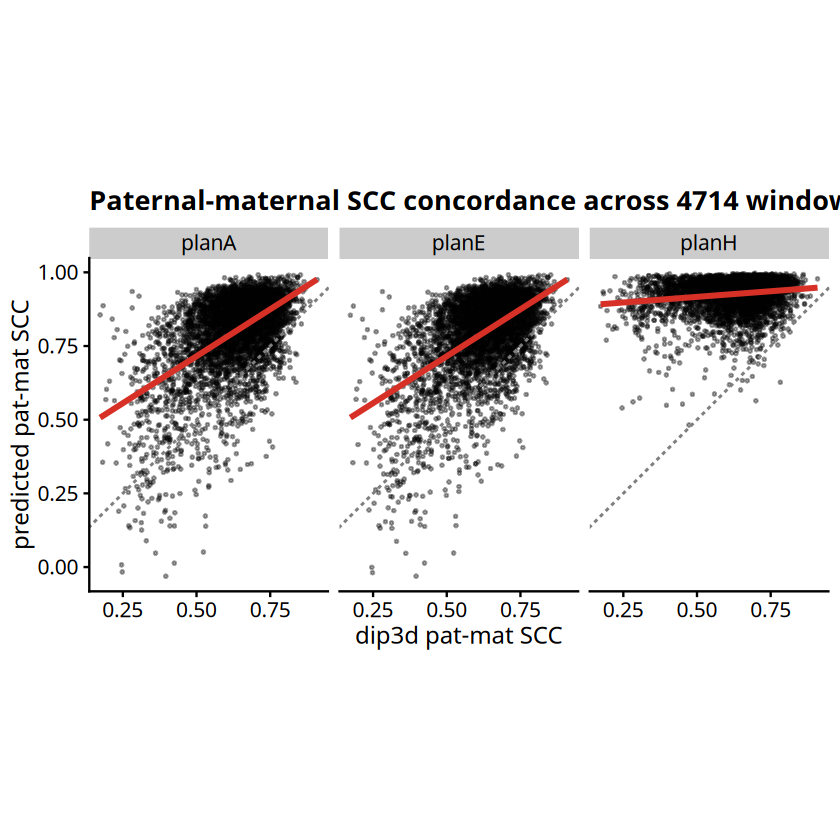

In [26]:
alias_note <- "Plan E all/merge are aliases of Plan A and are not independent predictions."

p_pm <- ggplot(pm_scc_df, aes(ref_pm_scc, pred_pm_scc)) +
  geom_point_rast(alpha = 0.35, size = 0.5) +
  geom_smooth(method = "lm", colour = "#D73027", se = FALSE) +
  geom_abline(slope = 1, intercept = 0, linetype = 2, colour = "grey50") +
  facet_wrap(~plan, nrow = 1) + coord_equal() + theme_cowplot() +
  labs(x = "dip3d pat-mat SCC", y = "predicted pat-mat SCC",
       title = sprintf("Paternal-maternal SCC concordance across %d windows", N_BENCH))
p_pm

In [37]:
library(ggpointdensity)

`geom_smooth()` using formula = 'y ~ x'


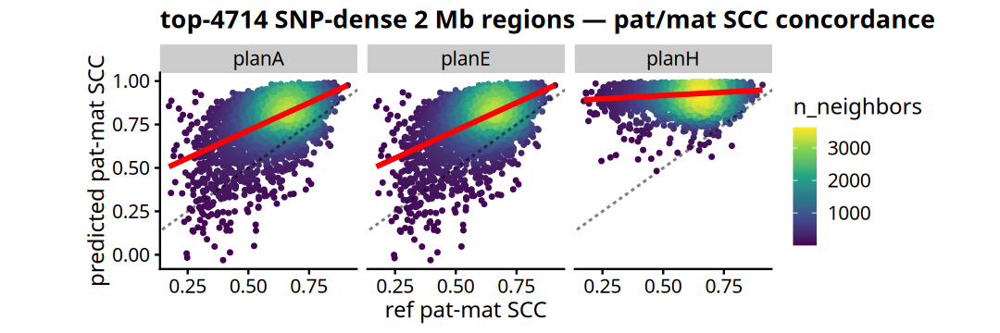

In [38]:
options(repr.plot.width = 9, repr.plot.height = 3)
p1 <- ggplot(pm_scc_df, aes(ref_pm_scc, pred_pm_scc)) +
  geom_pointdensity(size = 0.7) +
  geom_smooth(method = "lm", colour = "red", se = FALSE) +
  geom_abline(slope = 1, intercept = 0, linetype = 2, alpha = 0.5) +
  facet_wrap(~plan) +
  scale_color_viridis_c() +
  theme_cowplot() +
  coord_equal() +
  theme(aspect.ratio = 1) +
  labs(
    x = "ref pat-mat SCC", y = "predicted pat-mat SCC",
    title = sprintf("top-%d SNP-dense 2 Mb regions — pat/mat SCC concordance", N_BENCH)
  )
p1

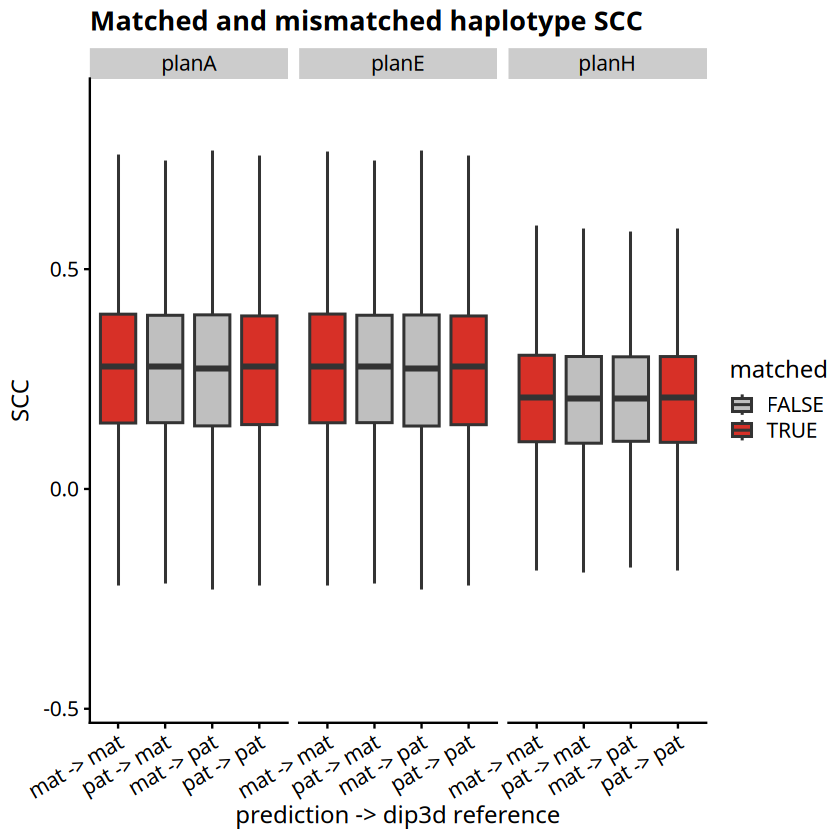

In [27]:
p_hap <- ggplot(vs_ref_df, aes(interaction(pred_type, ref_type, sep = " -> "), scc, fill = matched)) +
  geom_boxplot(outlier.shape = NA) +
  facet_wrap(~plan, nrow = 1) +
  scale_fill_manual(values = c(`FALSE` = "grey75", `TRUE` = "#D73027")) +
  theme_cowplot() + theme(axis.text.x = element_text(angle = 30, hjust = 1)) +
  labs(x = "prediction -> dip3d reference", y = "SCC",
       title = "Matched and mismatched haplotype SCC")
p_hap

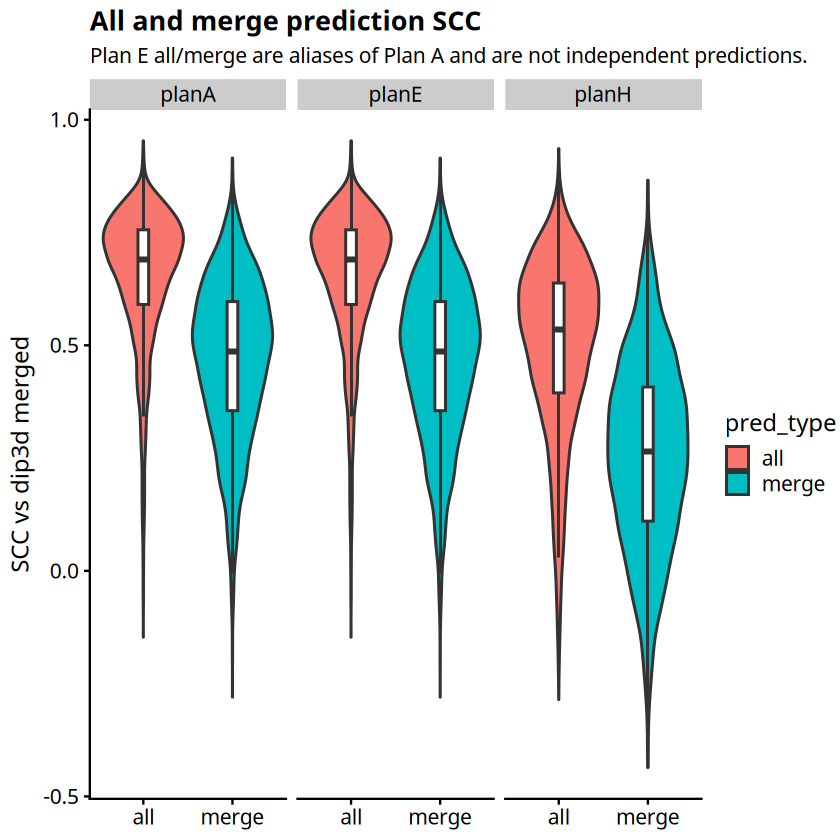

In [28]:
p_all_merge <- type_scc_df %>%
  filter(pred_type %in% c("all", "merge")) %>%
  ggplot(aes(pred_type, scc, fill = pred_type)) +
  geom_violin(scale = "width", trim = TRUE) +
  geom_boxplot(width = 0.12, outlier.shape = NA, fill = "white") +
  facet_wrap(~plan, nrow = 1) + theme_cowplot() +
  labs(x = NULL, y = "SCC vs dip3d merged",
       title = "All and merge prediction SCC", subtitle = alias_note)
p_all_merge

Warning message:
“Removed 4 rows containing non-finite outside the scale range
(`stat_ydensity()`).”
Warning message:
“Removed 4 rows containing non-finite outside the scale range
(`stat_boxplot()`).”


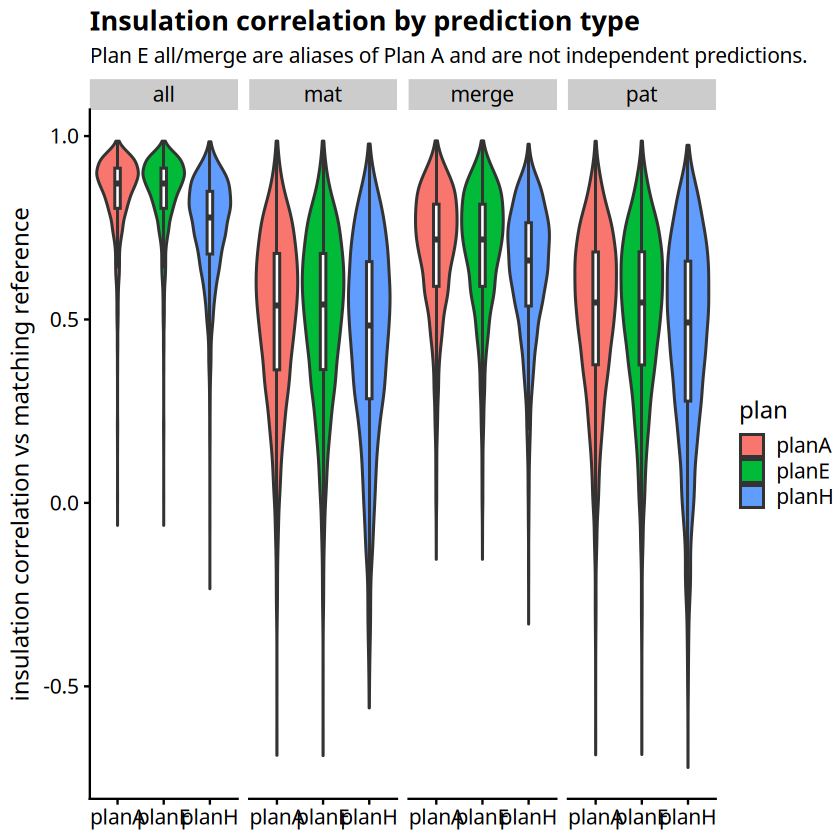

In [29]:
p_ins <- ggplot(ins_cor_df, aes(plan, insulation_cor, fill = plan)) +
  geom_violin(scale = "width", trim = TRUE) +
  geom_boxplot(width = 0.12, outlier.shape = NA, fill = "white") +
  facet_wrap(~pred_type, nrow = 1) + theme_cowplot() +
  labs(x = NULL, y = "insulation correlation vs matching reference",
       title = "Insulation correlation by prediction type", subtitle = alias_note)
p_ins

In [40]:
head(ins_cor_df)

chr,start,plan,pred_type,ref_type,aliased_from,insulation_cor
<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>
chr4,150500000,planA,all,merge,NA,0.8175181
chr4,150500000,planA,mat,mat,NA,0.6378528
chr4,150500000,planA,merge,merge,NA,0.7665776
chr4,150500000,planA,pat,pat,NA,0.8009437
chr4,150500000,planE,all,merge,planA/all,0.8175181
chr4,150500000,planE,mat,mat,NA,0.6379846


In [42]:
library(ggsignif)

In [44]:
ins_cor_df$pred_type <- factor(ins_cor_df$pred_type, levels = c("all","merge","pat","mat"))

Warning message:
“Removed 4 rows containing non-finite outside the scale range
(`stat_ydensity()`).”
Warning message:
“Removed 4 rows containing non-finite outside the scale range
(`stat_boxplot()`).”
Warning message:
“Removed 4 rows containing non-finite outside the scale range (`stat_signif()`).”


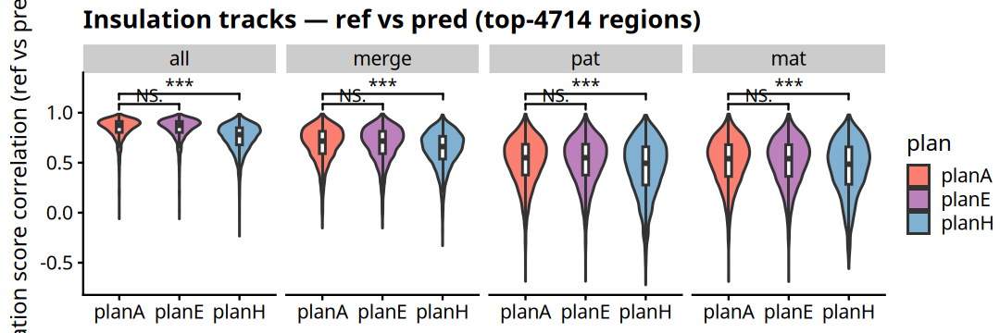

In [45]:
options(repr.plot.width = 9, repr.plot.height = 3)
p2 <- ggplot(ins_cor_df, aes(x = plan, y = insulation_cor)) +
  geom_violin(aes(fill = plan),width = 0.7, scale = "width") +
    geom_boxplot(outlier.shape = NA, width = 0.1) +
    facet_wrap(~ pred_type, nrow = 1) +
        geom_signif(comparisons = list(c("planA","planE"),c("planA","planH")),
         y_position = c(1,1.1), map_signif_level = T) +
    theme_cowplot() + ylim(NA,1.3) +
    scale_fill_manual(values = brewer.pal(10,"Set3")[c(4,10,5)]) +
    labs(x = NULL, y = "insulation score correlation (ref vs pred)",
         title = sprintf("Insulation tracks — ref vs pred (top-%d regions)", N_BENCH))
p2

In [67]:
save_plot('../results/CD_Revision2/corigami_model_compare_ins_cor_violin.pdf',p2,base_height = 3, base_width = 9)

Warning message:
“Removed 4 rows containing non-finite outside the scale range
(`stat_ydensity()`).”
Warning message:
“Removed 4 rows containing non-finite outside the scale range
(`stat_boxplot()`).”
Warning message:
“Removed 4 rows containing non-finite outside the scale range (`stat_signif()`).”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“for 'Insulation tracks — ref vs pred (top-4714 regions)' in 'mbcsToSbcs': - substituted for — (U+2014)”


In [30]:
summary_tbl <- bind_rows(
  pm_scc_df %>% group_by(plan) %>%
    summarise(metric = "pm_scc_concordance", pred_type = "pat_vs_mat", matched = NA,
              aliased_from = NA_character_, n = sum(complete.cases(ref_pm_scc, pred_pm_scc)),
              mean = NA_real_, median = NA_real_,
              mean_ref_pm_scc = mean(ref_pm_scc, na.rm = TRUE),
              median_ref_pm_scc = median(ref_pm_scc, na.rm = TRUE),
              mean_pred_pm_scc = mean(pred_pm_scc, na.rm = TRUE),
              median_pred_pm_scc = median(pred_pm_scc, na.rm = TRUE),
              concordance_cor = if (n > 1L) cor(ref_pm_scc, pred_pm_scc, use = "complete.obs") else NA_real_,
              .groups = "drop"),
  vs_ref_df %>% group_by(plan, matched) %>%
    summarise(metric = "haplotype_scc", pred_type = "pat_mat", aliased_from = NA_character_,
              n = sum(!is.na(scc)), mean = mean(scc, na.rm = TRUE), median = median(scc, na.rm = TRUE),
              .groups = "drop"),
  type_scc_df %>% filter(pred_type %in% c("all", "merge")) %>%
    group_by(plan, pred_type, aliased_from) %>%
    summarise(metric = "scc_vs_merged", matched = NA,
              n = sum(!is.na(scc)), mean = mean(scc, na.rm = TRUE), median = median(scc, na.rm = TRUE),
              .groups = "drop"),
  ins_cor_df %>% group_by(plan, pred_type, aliased_from) %>%
    summarise(metric = "insulation_correlation", matched = NA,
              n = sum(!is.na(insulation_cor)), mean = mean(insulation_cor, na.rm = TRUE),
              median = median(insulation_cor, na.rm = TRUE), .groups = "drop")
) %>% arrange(metric, pred_type, plan)

export_result(summary_tbl, "summary_tbl")
summary_tbl

plan,metric,pred_type,matched,aliased_from,n,mean,median,mean_ref_pm_scc,median_ref_pm_scc,mean_pred_pm_scc,median_pred_pm_scc,concordance_cor
<chr>,<chr>,<chr>,<lgl>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
planA,haplotype_scc,pat_mat,FALSE,NA,9428,0.2689056,0.2766447,NA,NA,NA,NA,NA
planA,haplotype_scc,pat_mat,TRUE,NA,9428,0.2703793,0.2789569,NA,NA,NA,NA,NA
planE,haplotype_scc,pat_mat,FALSE,NA,9428,0.2688822,0.2764944,NA,NA,NA,NA,NA
planE,haplotype_scc,pat_mat,TRUE,NA,9428,0.2703492,0.2789029,NA,NA,NA,NA,NA
planH,haplotype_scc,pat_mat,FALSE,NA,9428,0.2026735,0.2063597,NA,NA,NA,NA,NA
planH,haplotype_scc,pat_mat,TRUE,NA,9428,0.2037604,0.2085776,NA,NA,NA,NA,NA
planA,insulation_correlation,all,NA,NA,4714,0.8415079,0.8694392,NA,NA,NA,NA,NA
planE,insulation_correlation,all,NA,planA/all,4714,0.8415079,0.8694392,NA,NA,NA,NA,NA
planH,insulation_correlation,all,NA,NA,4713,0.7501766,0.7770924,NA,NA,NA,NA,NA


In [ ]:
ggsave(file.path(OUT_DIR, "pm_scc_concordance.pdf"), p_pm, width = 9, height = 3.5)
ggsave(file.path(OUT_DIR, "haplotype_matched_mismatched_scc.pdf"), p_hap, width = 10, height = 4)
ggsave(file.path(OUT_DIR, "all_merge_scc.pdf"), p_all_merge, width = 8, height = 3.5)
ggsave(file.path(OUT_DIR, "insulation_correlation.pdf"), p_ins, width = 11, height = 3.5)

## 9. Required spot checks

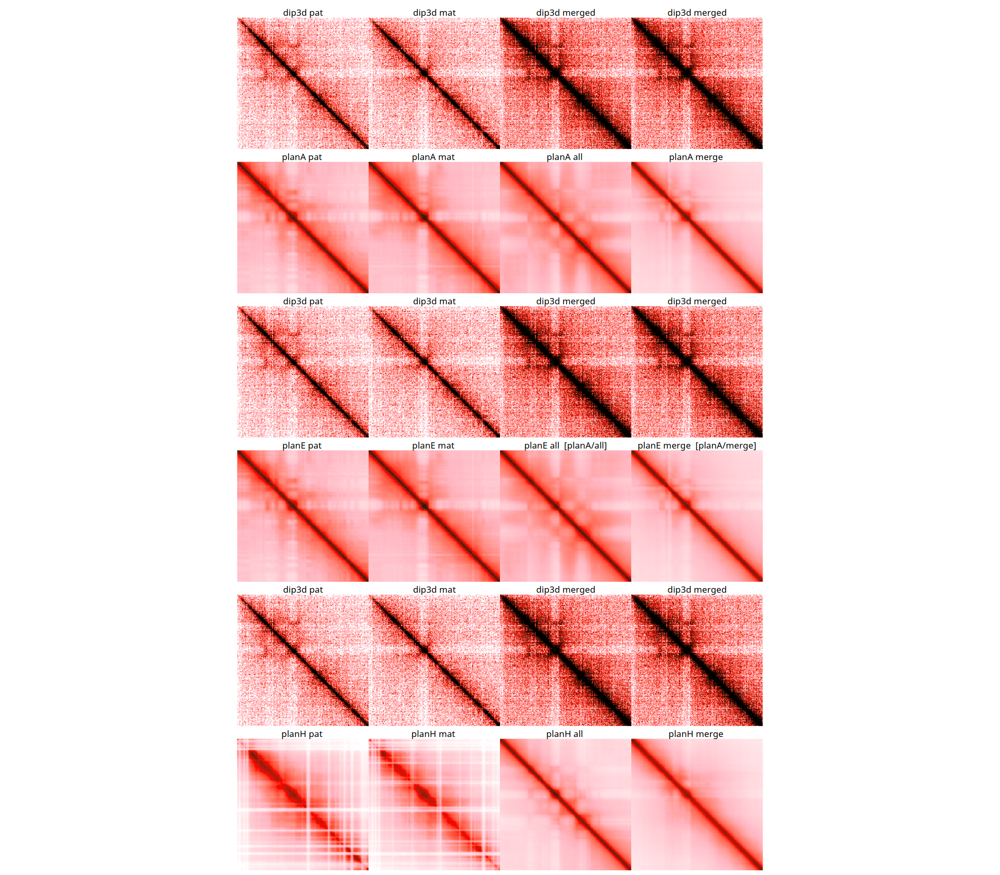

In [31]:
options(repr.plot.width = 16, repr.plot.height = 14)
p_chr15_maps <- plot_region_all_plans("chr15", 24500000, max_ref = 4, max_pred = 5)
p_chr15_maps

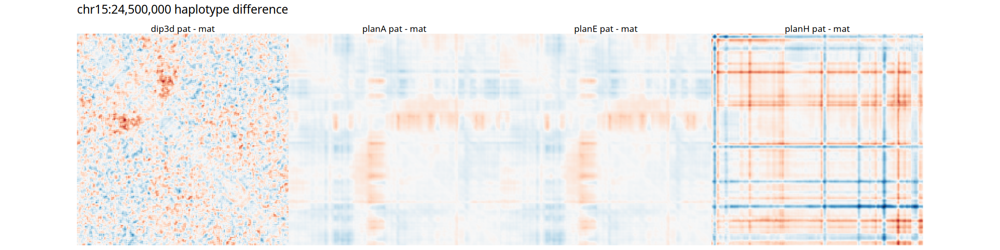

In [32]:
options(repr.plot.width = 16, repr.plot.height = 4)
p_chr15_diff <- plot_diff_map_compare("chr15", 24500000, max_ref = 2.5, max_pred = 1)
p_chr15_diff

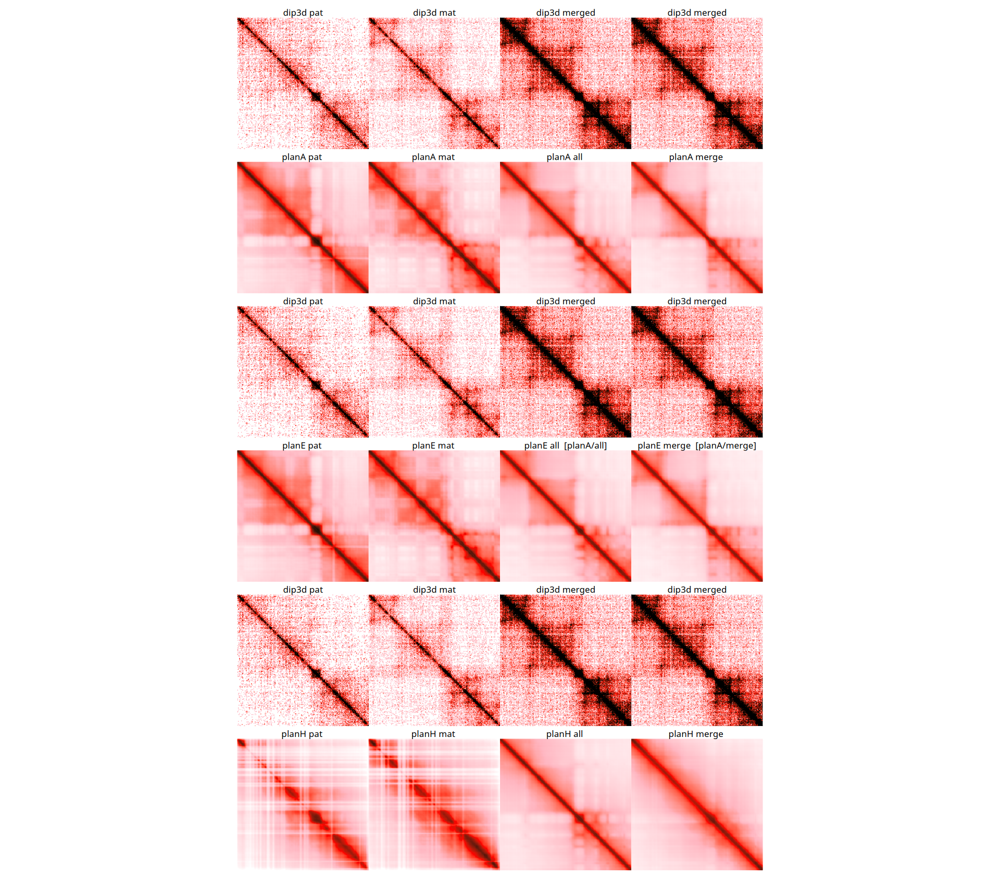

In [33]:
options(repr.plot.width = 16, repr.plot.height = 14)
p_chrX_maps <- plot_region_all_plans("chrX", 130500000, max_ref = 4, max_pred = 5)
p_chrX_maps

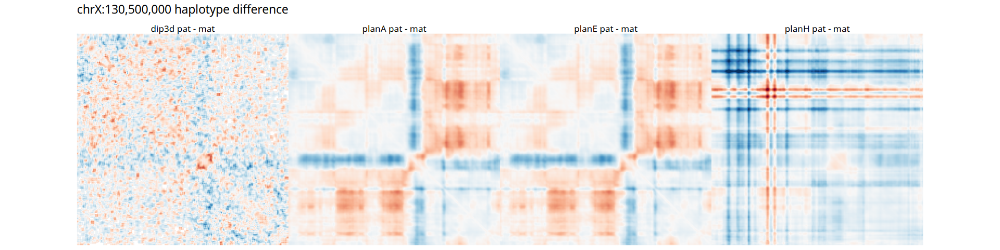

In [34]:
options(repr.plot.width = 16, repr.plot.height = 4)
p_chrX_diff <- plot_diff_map_compare("chrX", 130500000, max_ref = 2.5, max_pred = 1)
p_chrX_diff

In [ ]:
ggsave(file.path(OUT_DIR, "spotcheck_chr15_24500000_maps.pdf"), p_chr15_maps, width = 16, height = 14)
ggsave(file.path(OUT_DIR, "spotcheck_chr15_24500000_diff.pdf"), p_chr15_diff, width = 16, height = 4)
ggsave(file.path(OUT_DIR, "spotcheck_chrX_130500000_maps.pdf"), p_chrX_maps, width = 16, height = 14)
ggsave(file.path(OUT_DIR, "spotcheck_chrX_130500000_diff.pdf"), p_chrX_diff, width = 16, height = 4)

## 8. Spot-check imprinting / X-inactivation loci

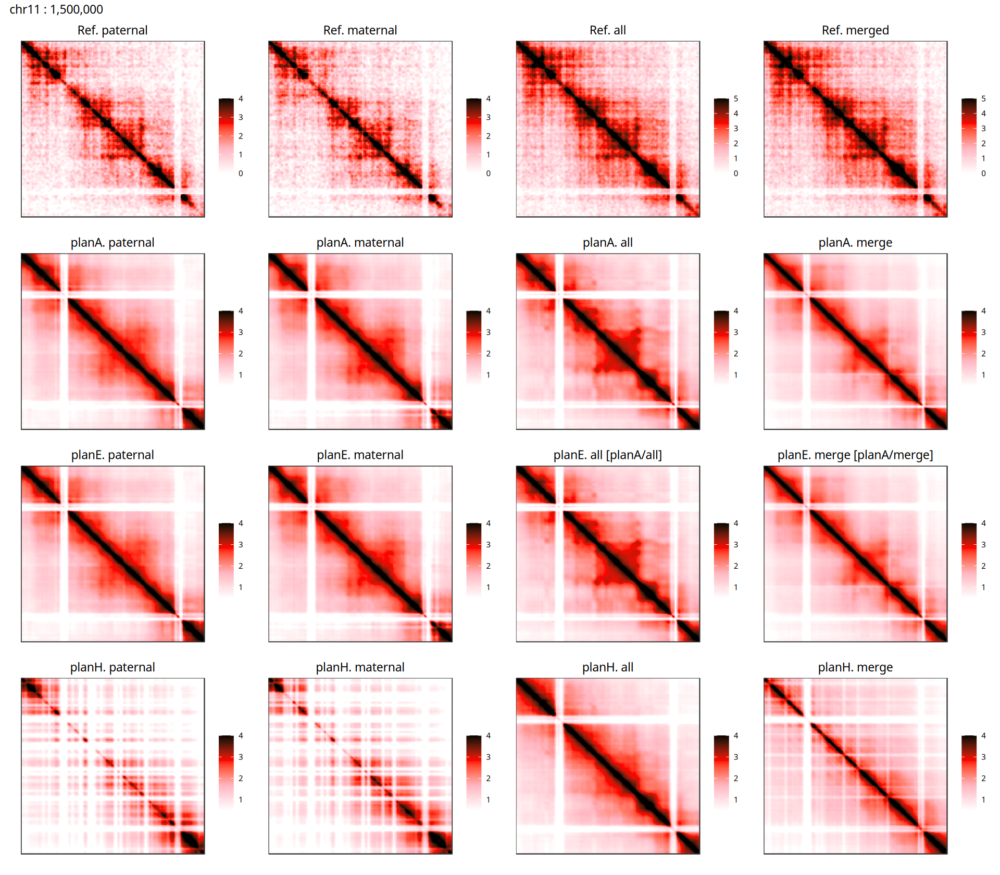

In [54]:
# H19 / IGF2 / KCNQ1 — chr11 1.5 Mb start (paternally expressed cluster)
options(repr.plot.width = 16, repr.plot.height = 14)
plot_comb_map("chr11", 1500000, max_pred = 4, max_ref = 4)

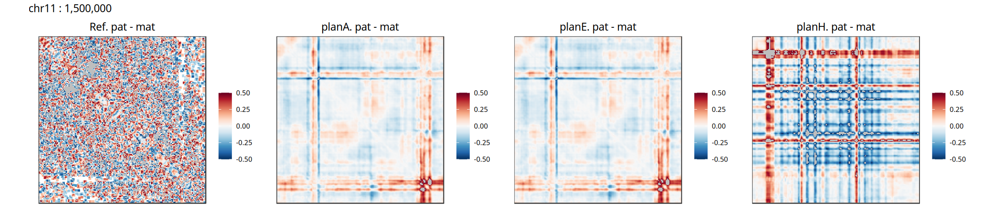

In [55]:
# H19 / IGF2 / KCNQ1 — chr11 1.5 Mb — all four plans pat-mat diff
options(repr.plot.width = 18, repr.plot.height = 4)
plot_diff_map_compare("chr11", 1500000,  max_ref = 0.5, max_pred = 0.5)

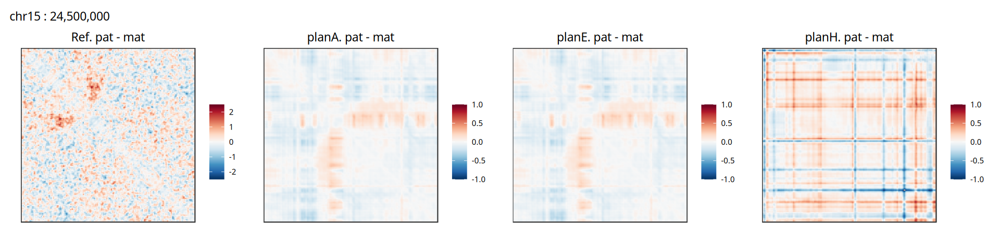

In [56]:
options(repr.plot.width = 16, repr.plot.height = 4)
# SNURF-SNRPN — chr15 ~24.5 Mb
p3 <- plot_diff_map_compare("chr15", 24500000, max_ref = 2.5, max_pred = 1)
p3

In [ ]:
#save_plot('../results/CD_Revision2/corigami_model_compare_diff_map_chr15_245.pdf',p3,base_height = 4, base_width = 16)

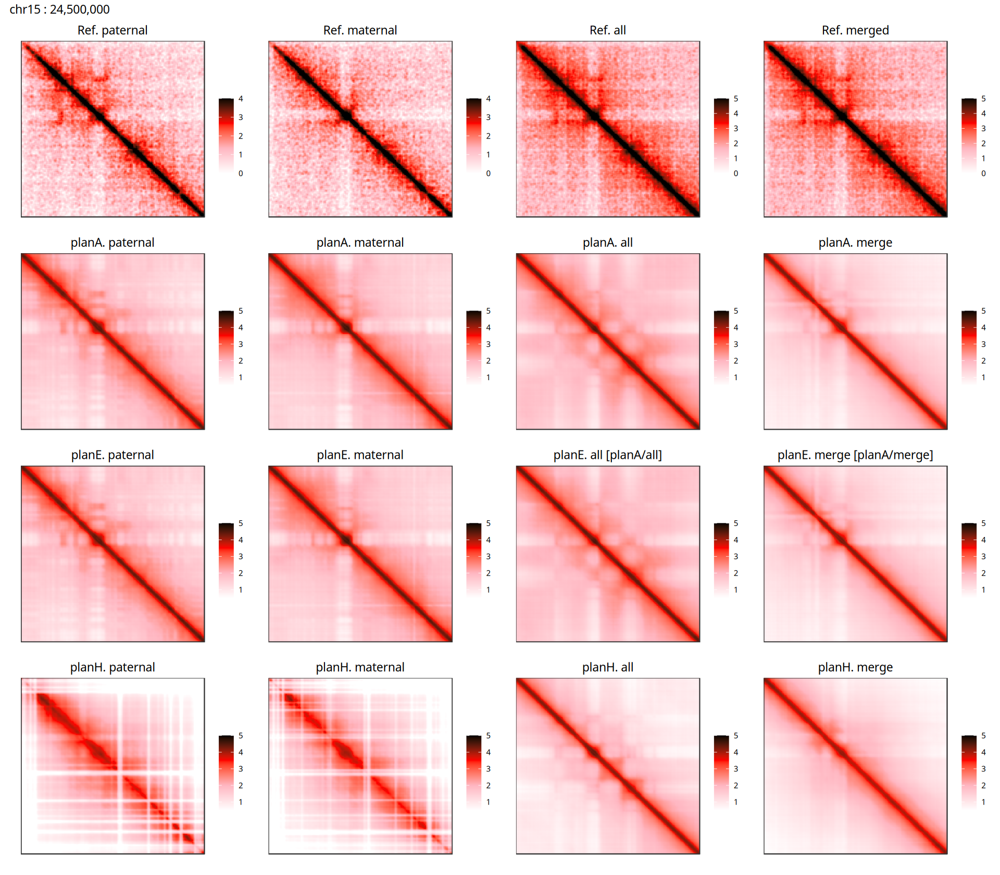

In [58]:
# H19 / IGF2 / KCNQ1 — chr11 1.5 Mb start (paternally expressed cluster)
options(repr.plot.width = 16, repr.plot.height = 14)
p5 <- plot_comb_map("chr15", 24500000, max_pred = 5, max_ref = 4)
p5

In [65]:
save_plot('../results/CD_Revision2/corigami_model_compare_comb_map_chr15_245_planAEH.pdf',p5,base_height = 14, base_width = 16)

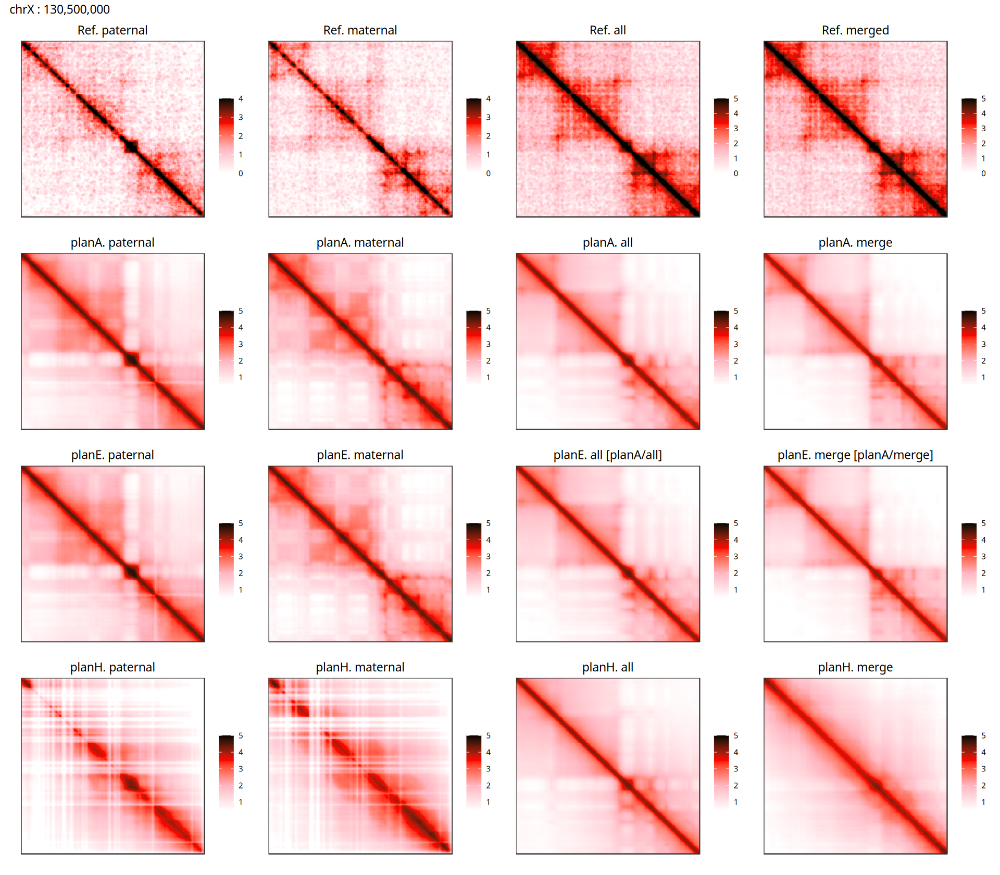

In [61]:
# H19 / IGF2 / KCNQ1 — chr11 1.5 Mb start (paternally expressed cluster)
options(repr.plot.width = 16, repr.plot.height = 14)
p6 <- plot_comb_map("chrX", 130500000, max_pred = 5, max_ref = 4)
p6

In [66]:
save_plot('../results/CD_Revision2/corigami_model_compare_comb_map_chrX_130.5_planAEH.pdf',p6,base_height = 14, base_width = 16)

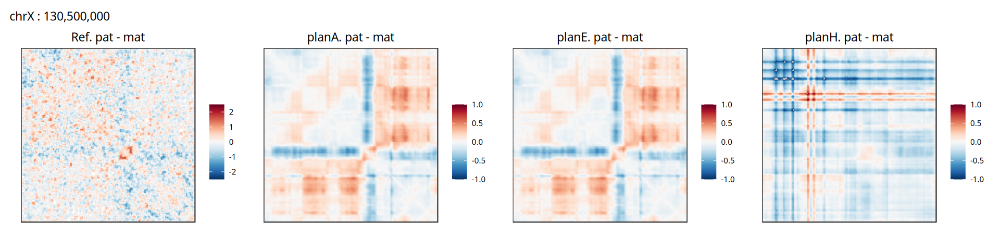

In [63]:
options(repr.plot.width = 16, repr.plot.height = 4)
# FIRRE on chrX — escape gene
p4 <- plot_diff_map_compare("chrX", 130500000, max_ref = 2.5, max_pred = 1)
p4

In [ ]:
#save_plot('../results/CD_Revision/corigami_model_compare_diff_map_chrX_130.5.pdf',p4,base_height = 4, base_width = 16)

## save data

In [64]:
base::save.image('./corigami_planAEH_bench/corigami_planAEH_bench.RData')